In [64]:
import numpy as np
import pandas as pd
from sklearn import linear_model
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib.font_manager as font_manager

### 结果图


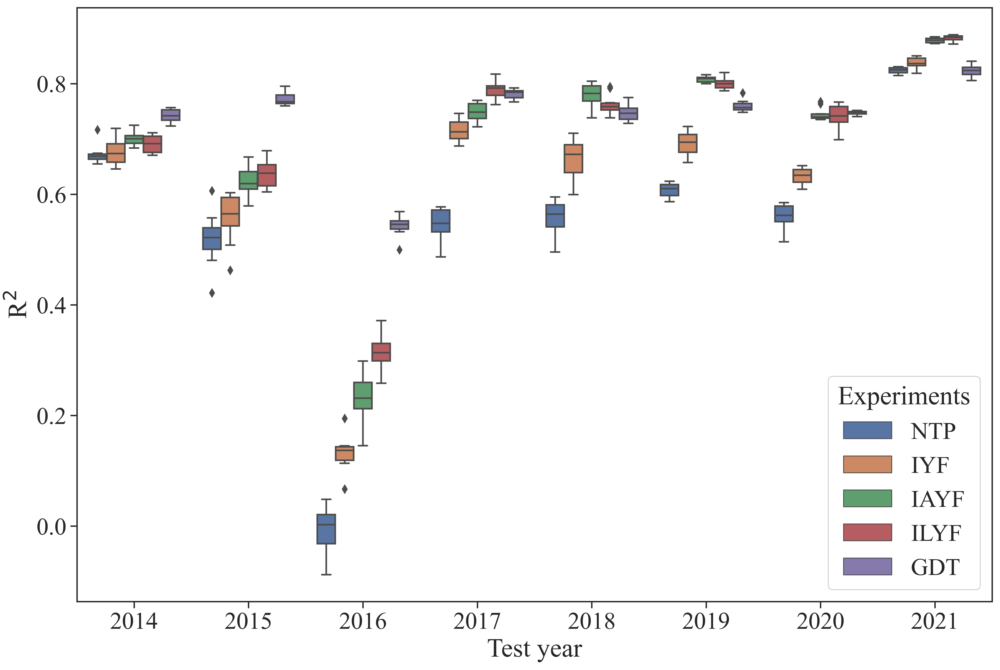

In [49]:
# R2 soybean
# Import Data
df = pd.read_csv('D:/论文-产量趋势利用/结果/' +'soybean_' +'_预测指标.csv')

# axs_row = 1
# axs_column = 1
# figure,ax = plt.subplots(axs_row, axs_column, figsize = (15*axs_column, 10*axs_row))
# sns.set_theme(style="white", palette=None)
sns.set_theme(style = 'ticks', font="Times New Roman", font_scale = 2)
# Draw Plot
plt.figure(figsize=(15,10), dpi= 500)
ax = sns.boxplot(x='test_year', y='R2', data=df, hue='experiment')
# sns.stripplot(x='test_year', y='R2', data=df, color='black', size=3, jitter=1)
# Decoration
# plt.title('Box Plot of Highway Mileage by Vehicle Class', fontsize=22)
plt.xticks(fontname = 'Times New Roman')
plt.yticks(fontname = 'Times New Roman')
plt.xlabel('Test year',fontname = 'Times New Roman')
plt.ylabel(r'R$\mathrm{^2}$',fontname = 'Times New Roman')


plt.legend(title = 'Experiments', loc = 'lower right')
plt.savefig(u'D:/论文-产量趋势利用/可视化/python图/'+'R2_大豆.jpg',dpi=500, bbox_inches='tight')
plt.show()

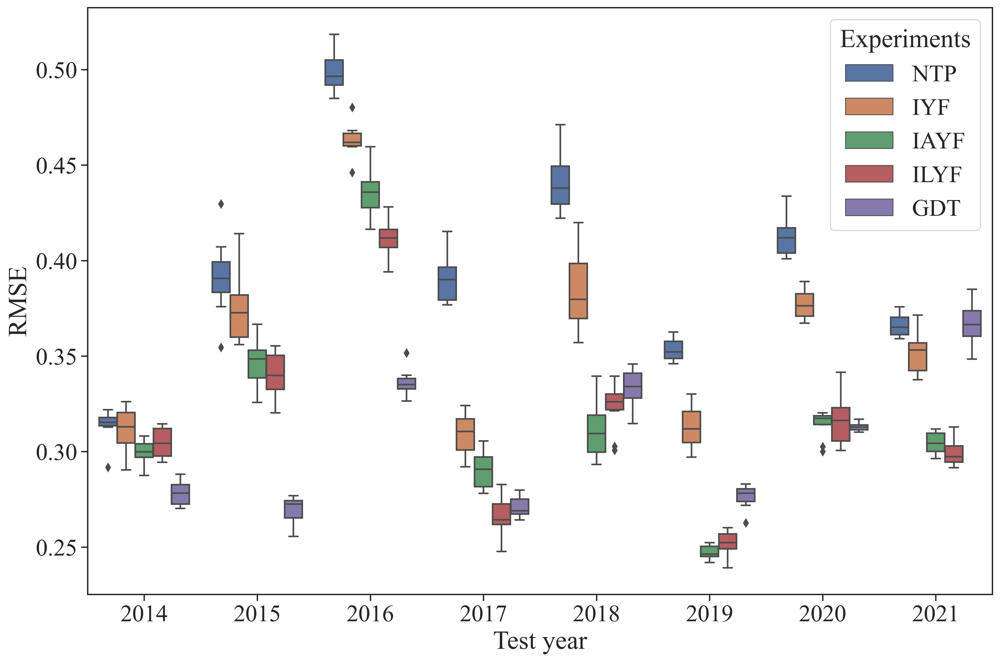

In [55]:
# RMSE soybean
# Import Data
df = pd.read_csv('D:/论文-产量趋势利用/结果/' +'soybean_' +'_预测指标.csv')

# axs_row = 1
# axs_column = 1
# figure,ax = plt.subplots(axs_row, axs_column, figsize = (15*axs_column, 10*axs_row))
# sns.set_theme(style="white", palette=None)
sns.set_theme(style = 'ticks', font="Times New Roman", font_scale = 2)
# Draw Plot
plt.figure(figsize=(15,10), dpi= 500)
ax = sns.boxplot(x='test_year', y='RMSE', data=df, hue='experiment')
# sns.stripplot(x='test_year', y='R2', data=df, color='black', size=3, jitter=1)
# Decoration
# plt.title('Box Plot of Highway Mileage by Vehicle Class', fontsize=22)
plt.xticks(fontname = 'Times New Roman')
plt.yticks(fontname = 'Times New Roman')
plt.xlabel('Test year',fontname = 'Times New Roman')
plt.ylabel(r'RMSE',fontname = 'Times New Roman')


plt.legend(title='Experiments',loc='upper right')
plt.savefig(u'D:/论文-产量趋势利用/可视化/python图/'+'RMSE_大豆.jpg',dpi=500, bbox_inches='tight')
plt.show()

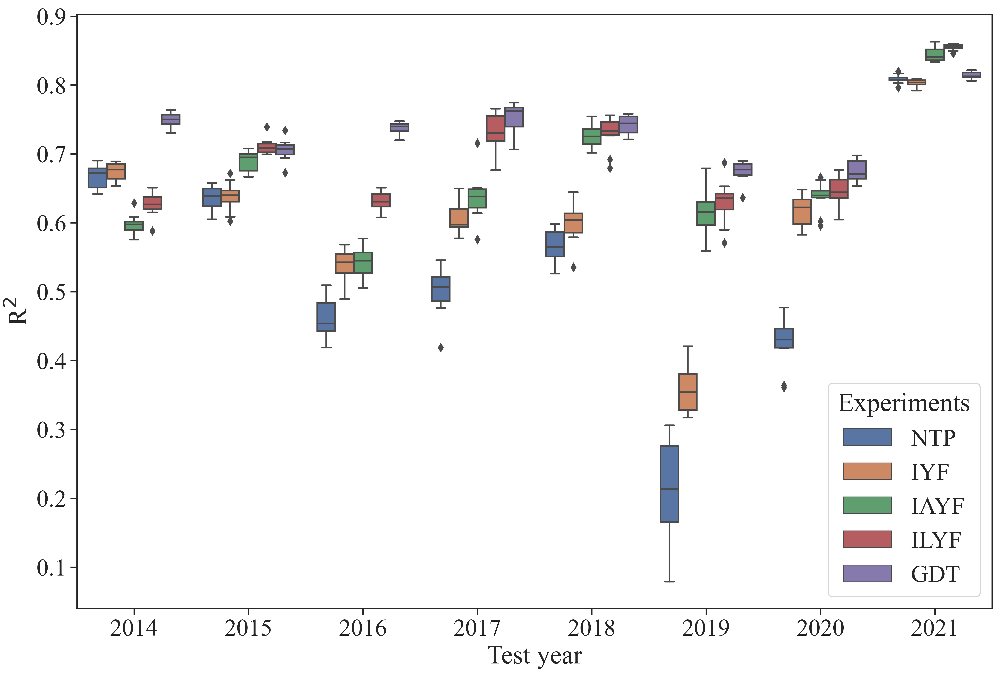

In [84]:
# R2 maize
# Import Data
df = pd.read_csv('D:/论文-产量趋势利用/结果/' +'maize_' +'_预测指标.csv')

# axs_row = 1
# axs_column = 1
# figure,ax = plt.subplots(axs_row, axs_column, figsize = (15*axs_column, 10*axs_row))
# sns.set_theme(style="white", palette=None)
sns.set_theme(style = 'ticks', font="Times New Roman", font_scale = 2)
# Draw Plot
plt.figure(figsize=(15,10), dpi= 500)
ax = sns.boxplot(x='test_year', y='R2', data=df, hue='experiment')
# sns.stripplot(x='test_year', y='R2', data=df, color='black', size=3, jitter=1)
# Decoration
# plt.title('Box Plot of Highway Mileage by Vehicle Class', fontsize=22)
plt.xticks(fontname = 'Times New Roman')
plt.yticks(fontname = 'Times New Roman')
plt.xlabel('Test year',fontname = 'Times New Roman')
plt.ylabel(r'R$\mathrm{^2}$',fontname = 'Times New Roman')


plt.legend(title = 'Experiments', loc = 'lower right')
plt.savefig(u'D:/论文-产量趋势利用/可视化/python图/'+'R2_玉米.jpg',dpi=500, bbox_inches='tight')
plt.show()

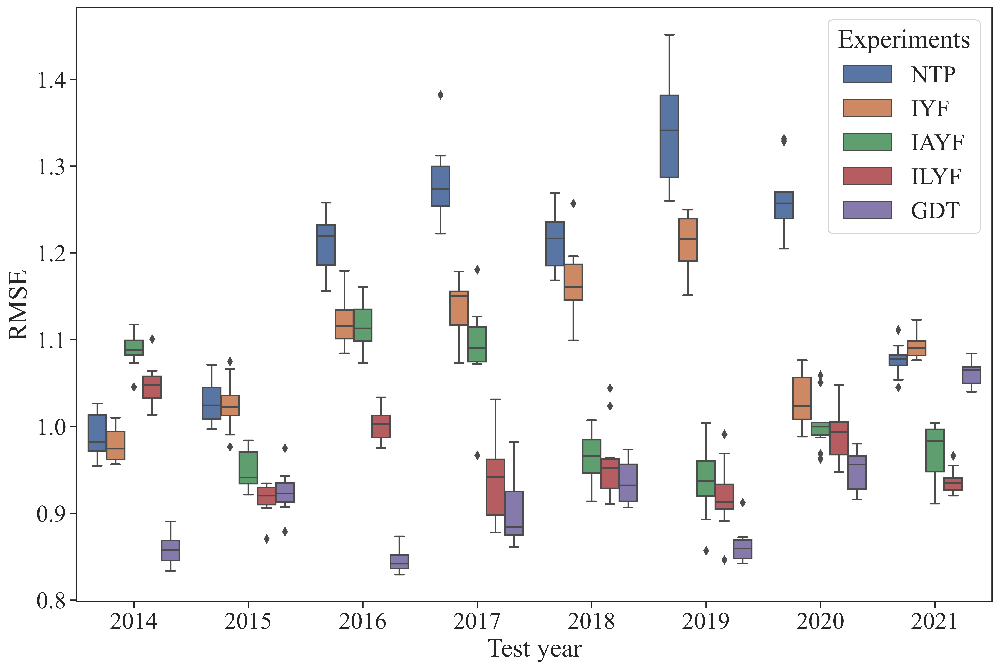

In [85]:
# RMSE maize
# Import Data
df = pd.read_csv('D:/论文-产量趋势利用/结果/' +'maize_' +'_预测指标.csv')

# axs_row = 1
# axs_column = 1
# figure,ax = plt.subplots(axs_row, axs_column, figsize = (15*axs_column, 10*axs_row))
# sns.set_theme(style="white", palette=None)
sns.set_theme(style = 'ticks', font="Times New Roman", font_scale = 2)
# Draw Plot
plt.figure(figsize=(15,10), dpi= 500)
ax = sns.boxplot(x='test_year', y='RMSE', data=df, hue='experiment')
# sns.stripplot(x='test_year', y='R2', data=df, color='black', size=3, jitter=1)
# Decoration
# plt.title('Box Plot of Highway Mileage by Vehicle Class', fontsize=22)
plt.xticks(fontname = 'Times New Roman')
plt.yticks(fontname = 'Times New Roman')
plt.xlabel('Test year',fontname = 'Times New Roman')
plt.ylabel(r'RMSE',fontname = 'Times New Roman')


plt.legend(title='Experiments',loc='upper right')
plt.savefig(u'D:/论文-产量趋势利用/可视化/python图/'+'RMSE_玉米.jpg',dpi=500, bbox_inches='tight')
plt.show()

### 试着计算输出结果的变异系数

In [ ]:
# 计算每一年的CV系数
result_dir = 'D:/论文-产量趋势利用/结果/预测结果/'
croptype = 'soybean'
CV_list = []
for exp in ['NTP', 'IYF', 'IAYF', 'ILYF', 'GDT']:
    for year in range(2014,2022):
        seed_CV = pd.Series([],name = 'pred')
        for seed in [9,19,29,39,49,59,69,79,89,99]:
            df = pd.read_csv(result_dir +croptype+'/'+str(seed) + '_' + str(year) + '_' + 'XGBoost' + '_' + 'exp'+str(exp)+'_N'+str(10)+'_预测结果.csv')
            seed_CV = pd.concat([seed_CV,df['pred']],axis = 0)
        arr = np.array(seed_CV)
        cv_arr = arr.std(axis=0, ddof=1) / arr.mean(axis=0)
        CV_list.append([year,exp,arr.std(axis=0, ddof=1),arr.mean(axis=0),cv_arr])
print(CV_list)

### 计算指标平均值

In [104]:
# 玉米指标平均值
df = pd.read_csv('D:/论文-产量趋势利用/结果/' +'maize_' +'_预测指标.csv')
df1 = df.groupby(['test_year', 'experiment'], as_index=False).agg({'RMSE':['mean','std'],'R2':['mean','std']})
df1.to_csv('D:/论文-产量趋势利用/结果/' +'maize_' +'_预测指标分年分组平均值.csv')
df2 = df.groupby(['experiment'], as_index=False).agg({'RMSE':['mean','std'],'R2':['mean','std']})
df2.to_csv('D:/论文-产量趋势利用/结果/' +'maize_' +'_预测指标分组平均值.csv')

In [103]:
# 大豆指标平均值
df = pd.read_csv('D:/论文-产量趋势利用/结果/' +'soybean_' +'_预测指标.csv')
df1 = df.groupby(['test_year', 'experiment'], as_index=False).agg({'RMSE':['mean','std'],'R2':['mean','std']})
df1.to_csv('D:/论文-产量趋势利用/结果/' +'soybean_' +'_预测指标分年分组平均值.csv')
df2 = df.groupby(['experiment'], as_index=False).agg({'RMSE':['mean','std'],'R2':['mean','std']})
df2.to_csv('D:/论文-产量趋势利用/结果/' +'soybean_' +'_预测指标分组平均值.csv')

### 原始趋势图

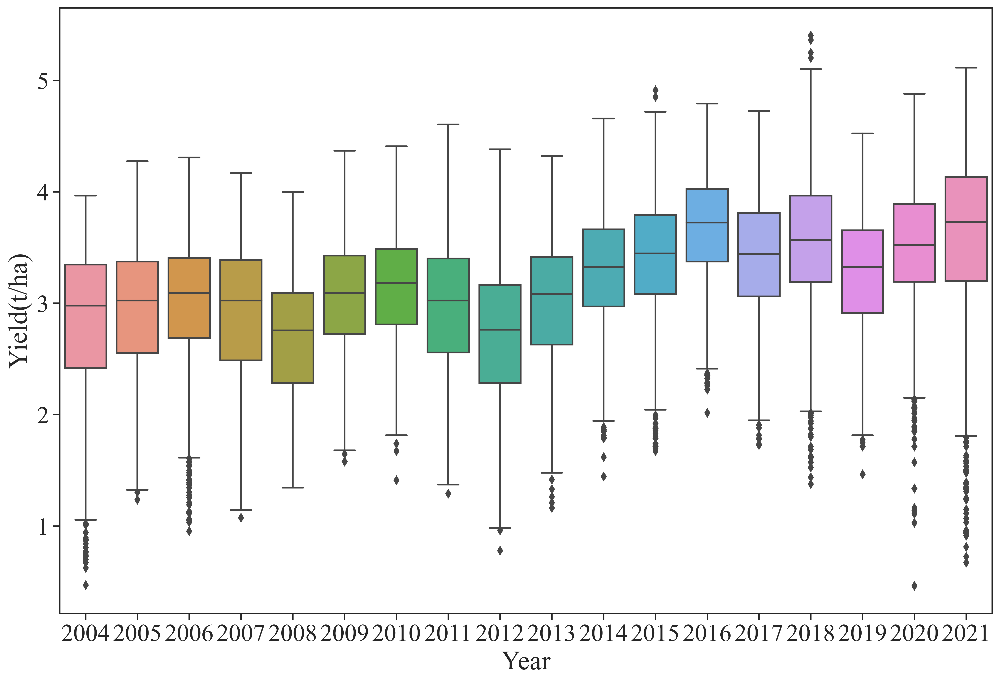

In [112]:
# soybean
# Import Data
df = pd.read_csv('D:/论文-产量趋势利用/数据/' +'input_' +'soybean.csv')

# axs_row = 1
# axs_column = 1
# figure,ax = plt.subplots(axs_row, axs_column, figsize = (15*axs_column, 10*axs_row))
# sns.set_theme(style="white", palette=None)
sns.set_theme(style = 'ticks', font="Times New Roman", font_scale = 2)
# Draw Plot
plt.figure(figsize=(15,10), dpi= 500)
ax = sns.boxplot(x='Year', y='yield(t/ha)', data=df)
# sns.stripplot(x='test_year', y='R2', data=df, color='black', size=3, jitter=1)
# Decoration
# plt.title('Box Plot of Highway Mileage by Vehicle Class', fontsize=22)
plt.xticks(fontname = 'Times New Roman')
plt.yticks(fontname = 'Times New Roman')
plt.xlabel('Year',fontname = 'Times New Roman')
plt.ylabel(r'Yield(t/ha)',fontname = 'Times New Roman')


# plt.legend(title='Experiments',loc='upper right')
plt.savefig(u'D:/论文-产量趋势利用/可视化/python图/'+'原始趋势_大豆.jpg',dpi=500, bbox_inches='tight')
plt.show()

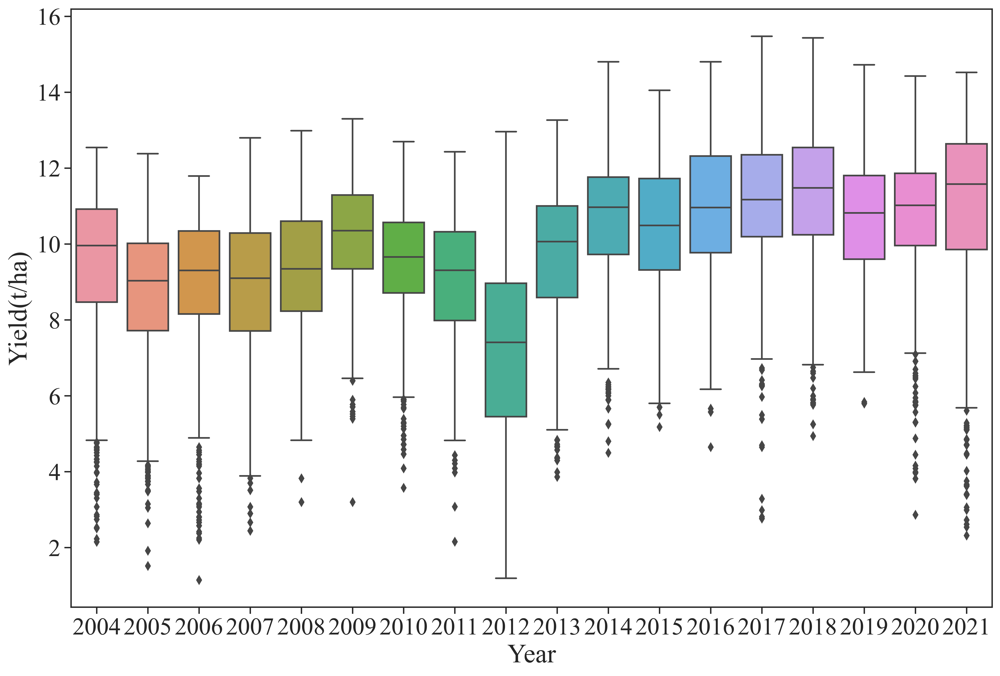

In [113]:
# maize
# Import Data
df = pd.read_csv('D:/论文-产量趋势利用/数据/' +'input_' +'maize.csv')

# axs_row = 1
# axs_column = 1
# figure,ax = plt.subplots(axs_row, axs_column, figsize = (15*axs_column, 10*axs_row))
# sns.set_theme(style="white", palette=None)
sns.set_theme(style = 'ticks', font="Times New Roman", font_scale = 2)
# Draw Plot
plt.figure(figsize=(15,10), dpi= 500)
ax = sns.boxplot(x='Year', y='yield(t/ha)', data=df)
# sns.stripplot(x='test_year', y='R2', data=df, color='black', size=3, jitter=1)
# Decoration
# plt.title('Box Plot of Highway Mileage by Vehicle Class', fontsize=22)
plt.xticks(fontname = 'Times New Roman')
plt.yticks(fontname = 'Times New Roman')
plt.xlabel('Year',fontname = 'Times New Roman')
plt.ylabel(r'Yield(t/ha)',fontname = 'Times New Roman')


# plt.legend(title='Experiments',loc='upper right')
plt.savefig(u'D:/论文-产量趋势利用/可视化/python图/'+'原始趋势_玉米.jpg',dpi=500, bbox_inches='tight')
plt.show()

### 空间散点分布图

[4.65696]
[4.65696]
[4.65696]
[4.65696]
[4.65696]
[4.91232]
[4.91232]
[4.91232]
[4.91232]
[4.91232]
[4.79136]
[4.79136]
[4.79136]
[4.79136]
[4.79136]
[4.72416]
[4.72416]
[4.72416]
[4.72416]
[4.72416]
[5.40288]
[5.40288]
[5.40288]
[5.40288]
[5.40288]
[4.52256]
[4.52256]
[4.52256]
[4.52256]
[4.52256]
[4.87872]
[4.87872]
[4.87872]
[4.87872]
[4.87872]
[5.11392]
[5.11392]
[5.11392]
[5.11392]
[5.11392]


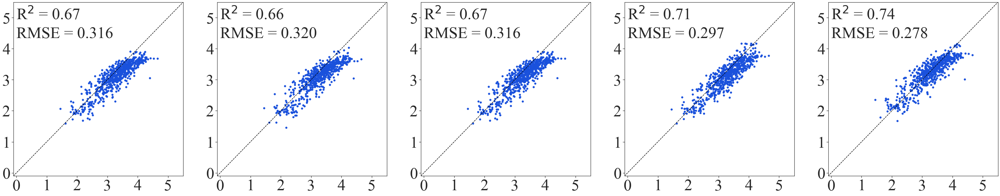

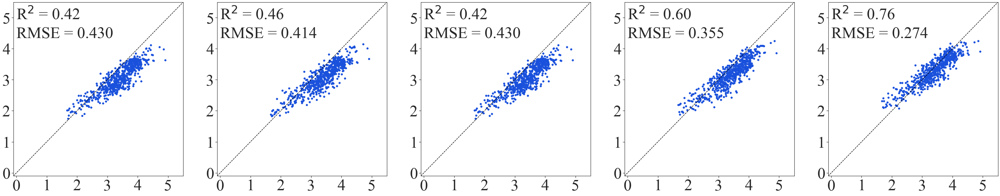

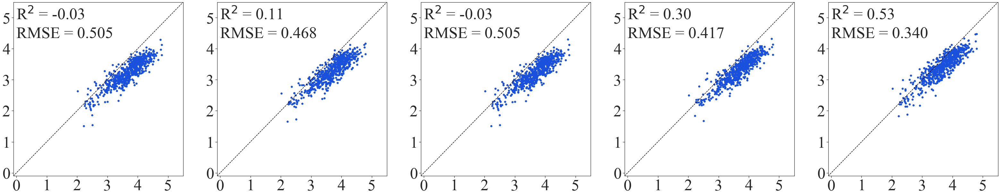

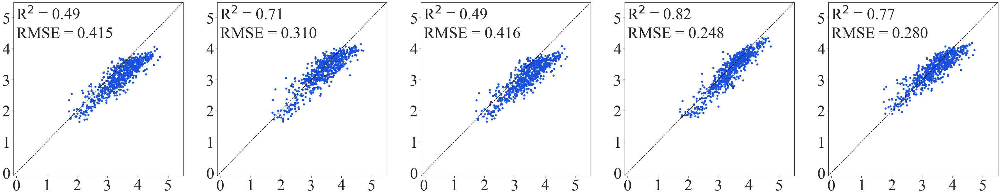

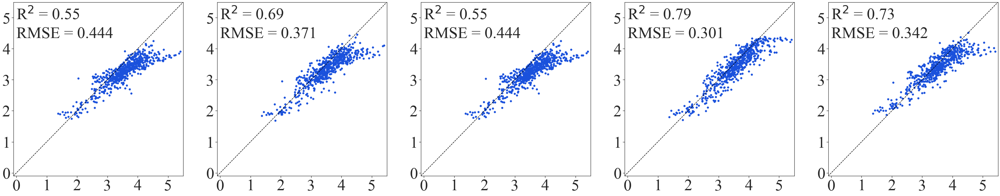

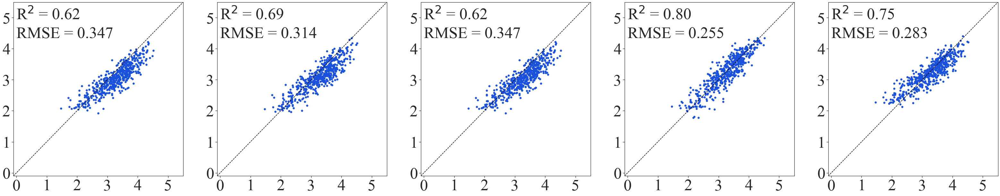

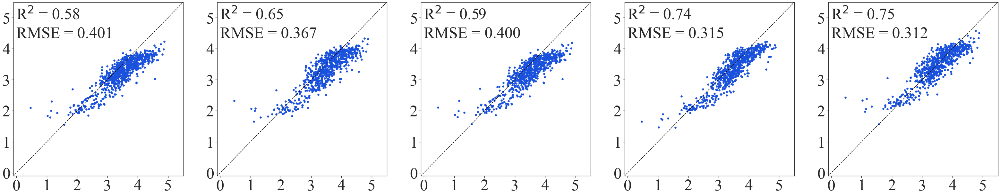

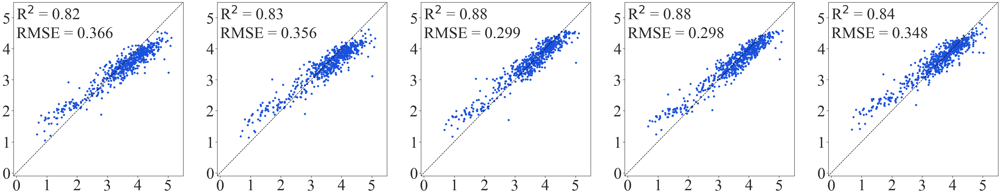

In [59]:
### 散点图 大豆 2016， 2021
from sklearn.metrics import mean_squared_error,mean_absolute_error, r2_score

# define size of figure and number of axes
for YEAR in range(2014,2022):
    axs_row = 1
    axs_column = 5
    figure,ax = plt.subplots(axs_row, axs_column, figsize = (11*axs_column, 10*axs_row))
    seed = 99
    sns.set_theme(style="white", palette=None)
    sns.set_style("ticks", {"xtick.major.size": 8, "ytick.major.size": 8})
    de_list = ['NTP','IYF','IAYF','ILYF','GDT']
    # YEAR = 2014

    for i in de_list:
        ax[de_list.index(i)].set_xlim(-0.1,5.5)
        ax[de_list.index(i)].set_ylim(-0.1,5.5)
        data = pd.read_csv(r'D:\\论文-产量趋势利用\\结果\\预测结果\\soybean\\'+str(seed)+'_'+str(YEAR)+'_XGBoost_exp'+i+'_N10_预测结果.csv',engine = 'python')
    #     data_irri = data[data['irrigation'] == 0]
    #     data_drought = data[data['Setting Pods_pdsi'] < -4]
        X = (np.array(data['yield(t/ha)'])).reshape(-1,1)
        Y = (np.array(data['pred'])).reshape(-1,1)
#         print(max(X))
        # plot the linear line
        line, = ax[de_list.index(i)].plot([-0.1,5.5], [-0.1,5.5], color = 'black', label = '1:1 line',linestyle='dashed')
        # plot scatter
        ax[de_list.index(i)].scatter(X, Y, s = 30, color='#1a51dc')
        ax[de_list.index(i)].text(0, 4.95, r'R$\mathrm{^2}$ = %.2f'%(r2_score(X,Y)), fontsize = 50, fontname = 'Times New Roman', backgroundcolor='white')
        ax[de_list.index(i)].text(0, 4.35, r'RMSE = %.3f'%np.sqrt(mean_squared_error(X,Y)), fontsize = 50, fontname = 'Times New Roman', backgroundcolor='white')
        # ticks
        tick = [i for i in range(0, 6)]
        ax[de_list.index(i)].set_xticks(ticks = tick)
        ax[de_list.index(i)].set_yticks(ticks = tick)
        ax[de_list.index(i)].set_xticklabels(tick, fontsize =50, fontname = 'Times New Roman')
        ax[de_list.index(i)].set_yticklabels(tick, fontsize = 50, fontname = 'Times New Roman')
        ax[de_list.index(i)].set_facecolor('white')
        # Set the x and y axis scales

    plt.grid(visible=False)

#     # save figure # SVR XGBoost
    plt.savefig(u'D:\\论文-产量趋势利用\\可视化\\python图\\'+str(YEAR)+'年大豆_99.jpg',dpi=500, bbox_inches='tight')
    plt.show()
    plt.clf()

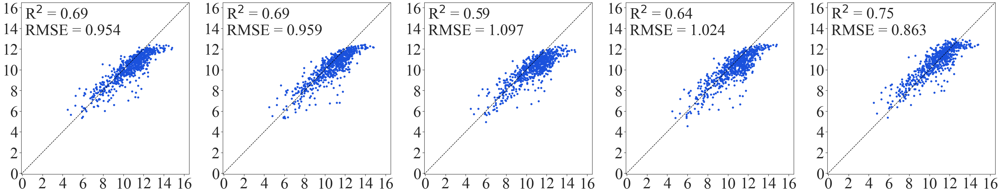

<Figure size 432x288 with 0 Axes>

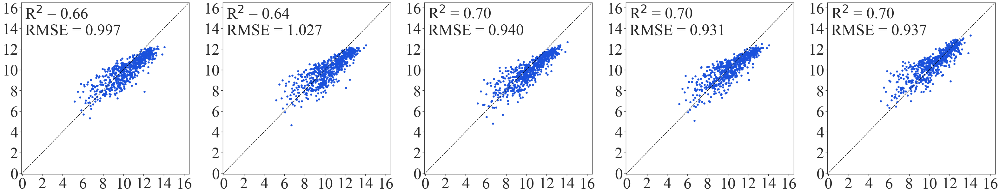

<Figure size 432x288 with 0 Axes>

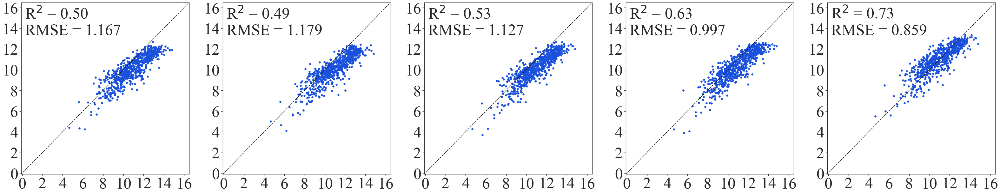

<Figure size 432x288 with 0 Axes>

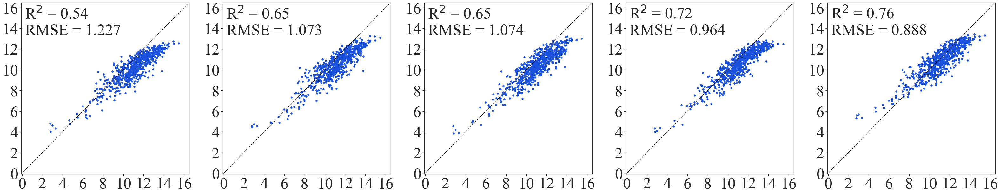

<Figure size 432x288 with 0 Axes>

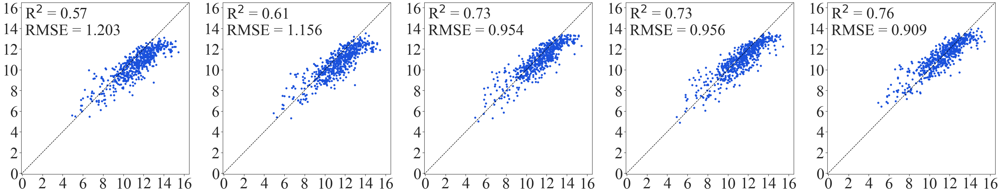

<Figure size 432x288 with 0 Axes>

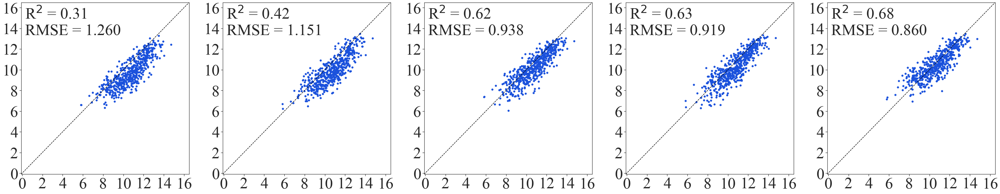

<Figure size 432x288 with 0 Axes>

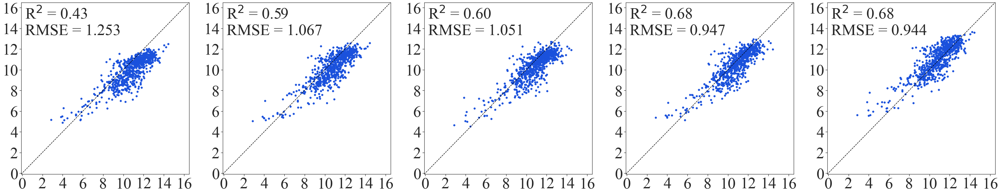

<Figure size 432x288 with 0 Axes>

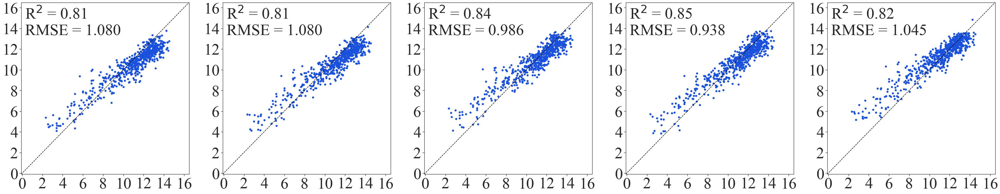

<Figure size 432x288 with 0 Axes>

In [63]:
### 散点图 玉米 2016， 2021
from sklearn.metrics import mean_squared_error,mean_absolute_error, r2_score

# define size of figure and number of axes
for YEAR in range(2014,2022):
    axs_row = 1
    axs_column = 5
    figure,ax = plt.subplots(axs_row, axs_column, figsize = (11*axs_column, 10*axs_row))
    seed = 99
    sns.set_theme(style="white", palette=None)
    sns.set_style("ticks", {"xtick.major.size": 8, "ytick.major.size": 8})
    de_list = ['NTP','IYF','IAYF','ILYF','GDT']
#     YEAR = 2019

    for i in de_list:
        ax[de_list.index(i)].set_xlim(-0.1,16.5)
        ax[de_list.index(i)].set_ylim(-0.1,16.5)
        data = pd.read_csv(r'D:\\论文-产量趋势利用\\结果\\预测结果\\maize\\'+str(seed)+'_'+str(YEAR)+'_XGBoost_exp'+i+'_N10_预测结果.csv',engine = 'python')
    #     data_irri = data[data['irrigation'] == 0]
    #     data_drought = data[data['Setting Pods_pdsi'] < -4]
        X = (np.array(data['yield(t/ha)'])).reshape(-1,1)
        Y = (np.array(data['pred'])).reshape(-1,1)
#         print(max(X))
        # plot the linear line
        line, = ax[de_list.index(i)].plot([-0.1,16.5], [-0.1,16.5], color = 'black', label = '1:1 line',linestyle='dashed')
        # plot scatter
        ax[de_list.index(i)].scatter(X, Y, s = 30, color='#1a51dc')
        ax[de_list.index(i)].text(0.3, 14.95, r'R$\mathrm{^2}$ = %.2f'%(r2_score(X,Y)), fontsize = 50, fontname = 'Times New Roman', backgroundcolor='white')
        ax[de_list.index(i)].text(0.3, 13.35, r'RMSE = %.3f'%np.sqrt(mean_squared_error(X,Y)), fontsize = 50, fontname = 'Times New Roman', backgroundcolor='white')
        # ticks
        tick = [i for i in range(0, 17, 2)]
        ax[de_list.index(i)].set_xticks(ticks = tick)
        ax[de_list.index(i)].set_yticks(ticks = tick)
        ax[de_list.index(i)].set_xticklabels(tick, fontsize =50, fontname = 'Times New Roman')
        ax[de_list.index(i)].set_yticklabels(tick, fontsize = 50, fontname = 'Times New Roman')
        ax[de_list.index(i)].set_facecolor('white')
        # Set the x and y axis scales

    plt.grid(visible=False)

    # save figure # SVR XGBoost
    plt.savefig(u'D:\\论文-产量趋势利用\\可视化\\python图\\'+str(YEAR)+'年玉米_99.jpg',dpi=500, bbox_inches='tight')
    plt.show()
    plt.clf()

### IAYF 年份图

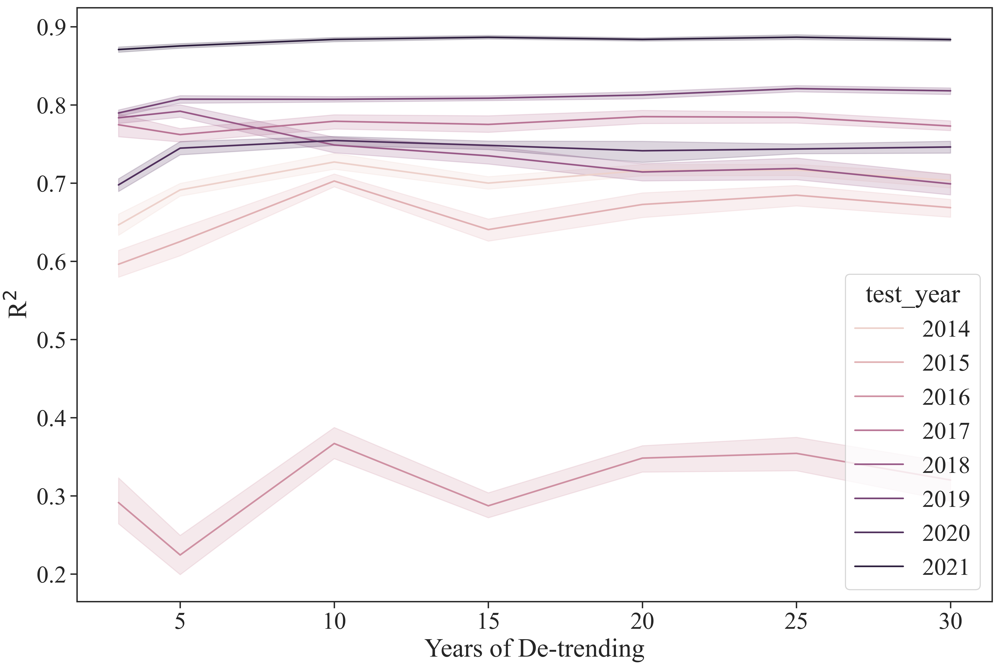

In [17]:
# soybean IAYF
# Import Data
df = pd.read_csv('D:/论文-产量趋势利用/结果/年份实验/' +'soybean_IAYF' +'_预测指标(不同trend_n).csv')

# axs_row = 1
# axs_column = 1
# figure,ax = plt.subplots(axs_row, axs_column, figsize = (15*axs_column, 10*axs_row))
# sns.set_theme(style="white", palette=None)
sns.set_theme(style = 'ticks', font="Times New Roman", font_scale = 2)
# Draw Plot
plt.figure(figsize=(15,10), dpi= 500)
# sns.boxplot(x='Year', y='yield(t/ha)', data=df)
# palette = sns.color_palette(8)
ax = sns.lineplot(x="trend_n", y="R2",
             hue="test_year", legend="full",
             data=df)
# sns.stripplot(x='test_year', y='R2', data=df, color='black', size=3, jitter=1)
# Decoration
# plt.title('Box Plot of Highway Mileage by Vehicle Class', fontsize=22)
plt.xticks(fontname = 'Times New Roman')
plt.yticks(fontname = 'Times New Roman')
plt.xlabel('Years of De-trending',fontname = 'Times New Roman')
plt.ylabel(r'R$\mathrm{^2}$',fontname = 'Times New Roman')


# plt.legend(title='Experiments',loc='upper right')
# lt.savefig(u'D:/论文-产量趋势利用/可视化/python图/'+'原始趋势_玉米.jpg',dpi=500, bbox_inches='tight')
plt.show()

### 趋势与异常图

#### 大豆

In [245]:
# 大豆
# x轴
from sklearn.linear_model import LinearRegression

data = pd.read_csv('D:/论文-产量趋势利用/数据/input_soybean_exp.csv', usecols = ['Year','State','sta_con','yield(t/ha)','yield_N30_EXP3'])

data = data.rename(columns = {'yield_N30_EXP3':'ILYF_yield'})
trend_n = 30
trend_yield = []
for test_year in range(2014,2022):
    linear_m = LinearRegression()
    data_train_val1 = data[data['Year'].isin([i for i in range(test_year-trend_n,test_year)])]
    print(set(data_train_val1.Year))
    X99 = np.array(data_train_val1['Year']).reshape(-1,1)
    Y99 = np.array(data_train_val1['yield(t/ha)']).reshape(-1,1)

    linear_m.fit(X99, Y99)

    print('The foluma of the yield trend: yield =  {:.3f}×year + {:.3f} '
          .format(linear_m.coef_[0,0],linear_m.intercept_[0]))
    trend_yield = linear_m.coef_[0,0]*test_year + linear_m.intercept_[0]
    print(trend_yield)
    
    # 创建一个布尔掩码，用于筛选出 Year 列中等于 2014 的行
    mask = data['Year'] == test_year

    # 使用 loc 方法选择满足条件的行，并计算新列的值
    data.loc[mask, 'GDT_yield'] = trend_yield
#     data['GDT_yield'] = 
data = data[data['Year'].isin([i for i in range(2014,2022)])]

# 使用 assign 方法计算绝对值并将结果作为新列添加到数据框中
data = data.assign(GDT_res=((data['GDT_yield'] - data['yield(t/ha)'])).abs())# /data['yield(t/ha)']
# data = data.assign(GDT_res=((data['GDT_yield'] - data['yield(t/ha)'])/data['GDT_yield']).abs())
data = data.assign(ILYF_res=((data['ILYF_yield'] - data['yield(t/ha)'])).abs())# /data['yield(t/ha)']
data


{1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013}
The foluma of the yield trend: yield =  0.030×year + -58.235 
3.0305333514416617
{1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014}
The foluma of the yield trend: yield =  0.030×year + -57.658 
3.0710115530134345
{1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015}
The foluma of the yield trend: yield =  0.033×year + -63.403 
3.151008443384491
{1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016}
The foluma of the yield trend: yie

,Year,State,sta_con,yield(t/ha),ILYF_yield,GDT_yield,GDT_res,ILYF_res
9,2014,illinois,illinois_de witt,4.26720,3.810664,3.030533,1.236667,0.456536
10,2015,illinois,illinois_de witt,4.26048,3.903412,3.071012,1.189468,0.357068
11,2016,illinois,illinois_de witt,4.17312,4.040517,3.151008,1.022112,0.132603
12,2017,illinois,illinois_de witt,4.42848,4.138949,3.267658,1.160822,0.289531
13,2018,illinois,illinois_de witt,5.04000,4.257257,3.343650,1.696350,0.782743
...,...,...,...,...,...,...,...,...
30235,2019,north dakota,north dakota_adams,2.37216,2.286911,3.374189,1.002029,0.085249
30236,2020,north dakota,north dakota_adams,1.14240,2.372160,3.396696,2.254296,1.229760
30237,2021,north dakota,north dakota_adams,1.06848,-0.087360,3.453945,2.385465,1.155840
30240,2020,south dakota,south dakota_pennington,0.46368,-4.672416,3.396696,2.933016,5.136096


In [189]:
data['GDT_res'].describe()

count    5069.000000
mean        0.536302
std         0.405182
min         0.000028
25%         0.210058
50%         0.464429
75%         0.772935
max         2.933016
Name: GDT_res, dtype: float64

In [190]:
data['ILYF_res'].describe()

count    5069.000000
mean        0.341701
std         0.266462
min         0.000062
25%         0.147840
50%         0.298341
75%         0.478788
max         5.136096
Name: ILYF_res, dtype: float64

In [246]:
# y轴
# GDT预测结果连接
# Import Data
exp = 'GDT'
# 创建一个空的列表用于存储每个数据框
dfs= []
# 遍历想读取的文件夹
for year in range(2014,2022):
    df = pd.read_csv('D:/论文-产量趋势利用/结果/预测结果/'+'soybean/99_' + str(year) +'_XGBoost_exp'+ exp +'_N10_预测结果.csv',index_col='Unnamed: 0')
    # 使用 assign 方法计算绝对值并将结果作为新列添加到数据框中
    df = df.assign(GDT_res_abs=df['residual'].abs())
    dfs.append(df)
# 将所有数据框按行拼接到一起
merged_GDT = pd.concat(dfs, axis=0)
merged_GDT.shape


(5069, 5)

In [247]:
# y轴
# ILYF预测结果连接
# Import Data
exp = 'ILYF'
# 创建一个空的列表用于存储每个数据框
dfs= []
# 遍历想读取的文件夹
for year in range(2014,2022):
    df = pd.read_csv('D:/论文-产量趋势利用/结果/预测结果/'+'soybean/99_' + str(year) +'_XGBoost_exp'+ exp +'_N10_预测结果.csv',index_col='Unnamed: 0')
    # 使用 assign 方法计算绝对值并将结果作为新列添加到数据框中
    df = df.assign(ILYF_res_abs=df['residual'].abs())
    dfs.append(df)
# 将所有数据框按行拼接到一起
merged_ILYF = pd.concat(dfs, axis=0)
merged_ILYF.shape

(5069, 5)

In [248]:
# y轴
# NTP预测结果连接
# Import Data
exp = 'NTP'
# 创建一个空的列表用于存储每个数据框
dfs = []
# 遍历想读取的文件夹
for year in range(2014,2022):
    df = pd.read_csv('D:/论文-产量趋势利用/结果/预测结果/'+'soybean/99_' + str(year) +'_XGBoost_exp'+ exp +'_N10_预测结果.csv',index_col='Unnamed: 0')
    # 使用 assign 方法计算绝对值并将结果作为新列添加到数据框中
    df = df.assign(NTP_res_abs=df['residual'].abs())
    dfs.append(df)
# 将所有数据框按行拼接到一起
merged_NTP = pd.concat(dfs, axis=0)
merged_NTP.shape

(5069, 5)

(5069, 14)
5069


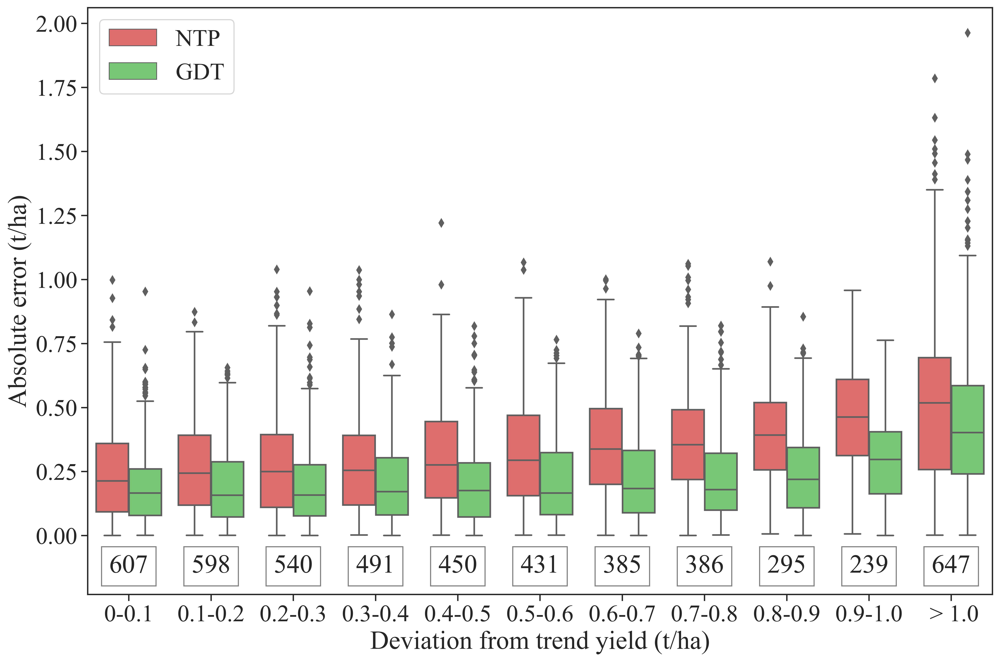

In [251]:
import statsmodels.api as sm
# 图
# 融合列
merged_df = pd.merge(merged_NTP, data, left_index=True, right_index=True,how = 'inner')
merged_df['GDT_res_abs'] = merged_GDT['GDT_res_abs']

sns.set_theme(style = 'ticks', font="Times New Roman", font_scale = 2)
# Draw Plot
plt.figure(figsize=(15,10), dpi= 500)

# # 使用cut函数将数据分为5个组
# merged_df['GDT_res_cut'] = pd.cut(merged_df['GDT_res'], bins=5, labels=['very low','low', 'medium', 'very high','high'])
# Define the bin edges
print(merged_df.shape)
bin_edges = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 3]
bin_labels = ['0-0.1', '0.1-0.2', '0.2-0.3', '0.3-0.4', '0.4-0.5', '0.5-0.6', '0.6-0.7','0.7-0.8','0.8-0.9','0.9-1.0',' > 1.0']
# Use pd.cut to create a new column with the custom bins
merged_df['GDT_res_cut'] = pd.cut(merged_df['GDT_res'], bins=bin_edges, labels=bin_labels)

# Count the number of values in each bin using value_counts()
bin_counts = merged_df['GDT_res_cut'].value_counts()
print(bin_counts.sum())
# 使用melt函数将NTP_res_abs和GDT_res_abs两列转换成一个列变量
df_melt = pd.melt(merged_df, id_vars=['GDT_res_cut'], value_vars=['NTP_res_abs', 'GDT_res_abs'], var_name='De-trend', value_name='value')

# Rename the legend of every variable to NTP and GDT
df_melt['De-trend'] = df_melt['De-trend'].map({'NTP_res_abs': 'NTP', 'GDT_res_abs': 'GDT'})

# 使用Seaborn的boxplot()函数绘制箱线图
ax = sns.boxplot(x='GDT_res_cut', y='value', hue='De-trend', data=df_melt,palette=['#f15b5b','#69d569'])

# Add the bin counts to the plot
for i, label in enumerate(bin_labels):
    # Get the x position of the label
    x = i
    
    # Get the y position of the count
    count = merged_df['GDT_res_cut'].value_counts().loc[label]
    
    # Add the count to the plot
    ax.text(x, -0.12, count, ha='center', va='center', bbox=dict(facecolor='none', edgecolor='gray', boxstyle='square'))

# Set the y-axis ticks to range from 0 to 2 with an interval of 0.25
ax.set_yticks(np.arange(0, 2.25, 0.25))
plt.xticks(fontname = 'Times New Roman')
plt.yticks(fontname = 'Times New Roman')
# 移动y轴的零点
ax.set_ylim(bottom=-0.23)

plt.xlabel('Deviation from trend yield (t/ha)',fontname = 'Times New Roman')
plt.ylabel(r'Absolute error (t/ha)',fontname = 'Times New Roman')


plt.legend(loc = 'upper left')
plt.savefig(u'D:/论文-产量趋势利用/可视化/python图/'+'大豆GDT_预测误差随偏离程度变化的关系图(绝对).jpg',dpi=500, bbox_inches='tight')
plt.show()

(5069, 14)
0.1-0.2    881
0-0.1      847
0.2-0.3    814
0.3-0.4    780
0.4-0.5    593
0.5-0.6    409
0.6-0.7    302
0.7-0.8    193
0.8-0.9    106
 > 1.0      83
0.9-1.0     61
Name: ILYF_res_cut, dtype: int64
847
881
814
780
593
409
302
193
106
61
83


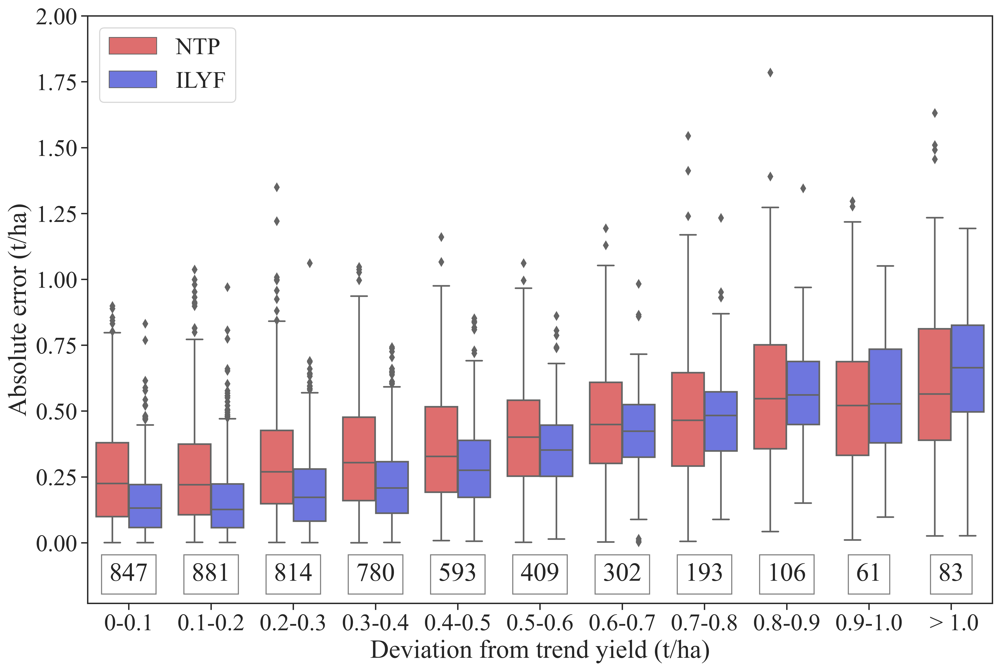

In [250]:
import statsmodels.api as sm
# 图
# 融合列
merged_df = pd.merge(merged_NTP, data, left_index=True, right_index=True,how = 'inner')
merged_df['ILYF_res_abs'] = merged_ILYF['ILYF_res_abs']

sns.set_theme(style = 'ticks', font="Times New Roman", font_scale = 2)
# Draw Plot
plt.figure(figsize=(15,10), dpi= 500)
print(merged_df.shape)
# # 使用cut函数将数据分为5个组
# merged_df['GDT_res_cut'] = pd.cut(merged_df['GDT_res'], bins=5, labels=['very low','low', 'medium', 'very high','high'])
# Define the bin edges
bin_edges = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 6]
bin_labels = ['0-0.1', '0.1-0.2', '0.2-0.3', '0.3-0.4', '0.4-0.5', '0.5-0.6', '0.6-0.7','0.7-0.8','0.8-0.9','0.9-1.0',' > 1.0']
# Use pd.cut to create a new column with the custom bins
merged_df['ILYF_res_cut'] = pd.cut(merged_df['ILYF_res'], bins=bin_edges, labels=bin_labels)

# Count the number of values in each bin using value_counts()
bin_counts = merged_df['ILYF_res_cut'].value_counts()
print(bin_counts)
# 使用melt函数将NTP_res_abs和GDT_res_abs两列转换成一个列变量
df_melt = pd.melt(merged_df, id_vars=['ILYF_res_cut'], value_vars=['NTP_res_abs', 'ILYF_res_abs'], var_name='De-trend', value_name='value')

# Rename the legend of every variable to NTP and GDT
df_melt['De-trend'] = df_melt['De-trend'].map({'NTP_res_abs': 'NTP', 'ILYF_res_abs': 'ILYF'})

# 使用Seaborn的boxplot()函数绘制箱线图
ax = sns.boxplot(x='ILYF_res_cut', y='value', hue='De-trend', data=df_melt, palette=['#f15b5b','#5b66f1'])

# Add the bin counts to the plot
for i, label in enumerate(bin_labels):
    # Get the x position of the label
    x = i
    
    # Get the y position of the count
    count = merged_df['ILYF_res_cut'].value_counts().loc[label]
    print(count)
    # Add the count to the plot
    ax.text(x, -0.12, count, ha='center', va='center', bbox=dict(facecolor='none', edgecolor='gray', boxstyle='square'))
# Set the y-axis ticks to range from 0 to 2 with an interval of 0.25
ax.set_yticks(np.arange(0, 2.25, 0.25))
plt.xticks(fontname = 'Times New Roman')
plt.yticks(fontname = 'Times New Roman')

# 移动y轴的零点
ax.set_ylim(bottom=-0.23)

plt.xlabel('Deviation from trend yield (t/ha)',fontname = 'Times New Roman')
plt.ylabel(r'Absolute error (t/ha)',fontname = 'Times New Roman')

plt.legend(loc = 'upper left')
plt.savefig(u'D:/论文-产量趋势利用/可视化/python图/'+'大豆ILYF_预测误差随偏离程度变化的关系图（绝对）.jpg',dpi=500, bbox_inches='tight')
plt.show()

#### 玉米

In [230]:
# 玉米
# x轴
from sklearn.linear_model import LinearRegression

data = pd.read_csv('D:/论文-产量趋势利用/数据/input_maize_exp.csv', usecols = ['Year','State','sta_con','yield(t/ha)','yield_N30_EXP3'])

data = data.rename(columns = {'yield_N30_EXP3':'ILYF_yield'})
trend_n = 30
trend_yield = []
for test_year in range(2014,2022):
    linear_m = LinearRegression()
    data_train_val1 = data[data['Year'].isin([i for i in range(test_year-trend_n,test_year)])]
    print(set(data_train_val1.Year))
    X99 = np.array(data_train_val1['Year']).reshape(-1,1)
    Y99 = np.array(data_train_val1['yield(t/ha)']).reshape(-1,1)

    linear_m.fit(X99, Y99)

    print('The foluma of the yield trend: yield =  {:.3f}×year + {:.3f} '
          .format(linear_m.coef_[0,0],linear_m.intercept_[0]))
    trend_yield = linear_m.coef_[0,0]*test_year + linear_m.intercept_[0]
    print(trend_yield)
    
    # 创建一个布尔掩码，用于筛选出 Year 列中等于 2014 的行
    mask = data['Year'] == test_year

    # 使用 loc 方法选择满足条件的行，并计算新列的值
    data.loc[mask, 'GDT_yield'] = trend_yield
#     data['GDT_yield'] = 
data = data[data['Year'].isin([i for i in range(2014,2022)])]

# 使用 assign 方法计算绝对值并将结果作为新列添加到数据框中
data = data.assign(GDT_res=((data['GDT_yield'] - data['yield(t/ha)'])).abs())# /data['yield(t/ha)']
# data = data.assign(GDT_res=((data['GDT_yield'] - data['yield(t/ha)'])/data['GDT_yield']).abs())
data = data.assign(ILYF_res=((data['ILYF_yield'] - data['yield(t/ha)'])).abs())# /data['yield(t/ha)']
data

{1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013}
The foluma of the yield trend: yield =  0.117×year + -226.754 
9.50233908642619
{1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014}
The foluma of the yield trend: yield =  0.124×year + -240.281 
9.759452639471306
{1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015}
The foluma of the yield trend: yield =  0.133×year + -257.905 
10.017979075317726
{1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016}
The foluma of the yield trend: yi

,Year,State,sta_con,yield(t/ha),ILYF_yield,GDT_yield,GDT_res,ILYF_res
9,2014,illinois,illinois_de witt,13.860902,11.293828,9.502339,4.358563,2.567074
10,2015,illinois,illinois_de witt,13.033011,11.773930,9.759453,3.273558,1.259081
11,2016,illinois,illinois_de witt,13.453228,12.137278,10.017979,3.435249,1.315950
12,2017,illinois,illinois_de witt,12.612793,12.588419,10.356444,2.256349,0.024374
13,2018,illinois,illinois_de witt,14.111778,12.875980,10.685420,3.426358,1.235798
...,...,...,...,...,...,...,...,...
32102,2020,indiana,indiana_switzerland,11.427404,10.147113,10.983082,0.444322,1.280291
32119,2020,north dakota,north dakota_slope,3.995201,5.859889,10.983082,6.987880,1.864688
32120,2021,north dakota,north dakota_slope,2.728277,4.304389,11.154374,8.426097,1.576112
32134,2020,wisconsin,wisconsin_bayfield,8.084481,12.513697,10.983082,2.898601,4.429217


In [231]:
data['GDT_res'].describe()

count    5131.000000
mean        1.530410
std         1.185102
min         0.000374
25%         0.619383
50%         1.331396
75%         2.179206
max         8.833771
Name: GDT_res, dtype: float64

In [232]:
data['ILYF_res'].describe()

count    5131.000000
mean        1.013769
std         0.812189
min         0.000750
25%         0.394539
50%         0.837034
75%         1.417947
max         5.358194
Name: ILYF_res, dtype: float64

In [234]:
# y轴
# GDT预测结果连接
# Import Data
exp = 'GDT'
# 创建一个空的列表用于存储每个数据框
dfs= []
# 遍历想读取的文件夹
for year in range(2014,2022):
    df = pd.read_csv('D:/论文-产量趋势利用/结果/预测结果/'+'maize/99_' + str(year) +'_XGBoost_exp'+ exp +'_N10_预测结果.csv',index_col='Unnamed: 0')
    # 使用 assign 方法计算绝对值并将结果作为新列添加到数据框中
    df = df.assign(GDT_res_abs=df['residual'].abs())
    dfs.append(df)
# 将所有数据框按行拼接到一起
merged_GDT = pd.concat(dfs, axis=0)
merged_GDT.shape

(5131, 5)

In [235]:
# y轴
# ILYF预测结果连接
# Import Data
exp = 'ILYF'
# 创建一个空的列表用于存储每个数据框
dfs= []
# 遍历想读取的文件夹
for year in range(2014,2022):
    df = pd.read_csv('D:/论文-产量趋势利用/结果/预测结果/'+'maize/99_' + str(year) +'_XGBoost_exp'+ exp +'_N10_预测结果.csv',index_col='Unnamed: 0')
    # 使用 assign 方法计算绝对值并将结果作为新列添加到数据框中
    df = df.assign(ILYF_res_abs=df['residual'].abs())
    dfs.append(df)
# 将所有数据框按行拼接到一起
merged_ILYF = pd.concat(dfs, axis=0)
merged_ILYF.shape

(5131, 5)

In [236]:
# y轴
# NTP预测结果连接
# Import Data
exp = 'NTP'
# 创建一个空的列表用于存储每个数据框
dfs = []
# 遍历想读取的文件夹
for year in range(2014,2022):
    df = pd.read_csv('D:/论文-产量趋势利用/结果/预测结果/'+'maize/99_' + str(year) +'_XGBoost_exp'+ exp +'_N10_预测结果.csv',index_col='Unnamed: 0')
    # 使用 assign 方法计算绝对值并将结果作为新列添加到数据框中
    df = df.assign(NTP_res_abs=df['residual'].abs())
    dfs.append(df)
# 将所有数据框按行拼接到一起
merged_NTP = pd.concat(dfs, axis=0)
merged_NTP.shape

(5131, 5)

(5131, 14)
5131


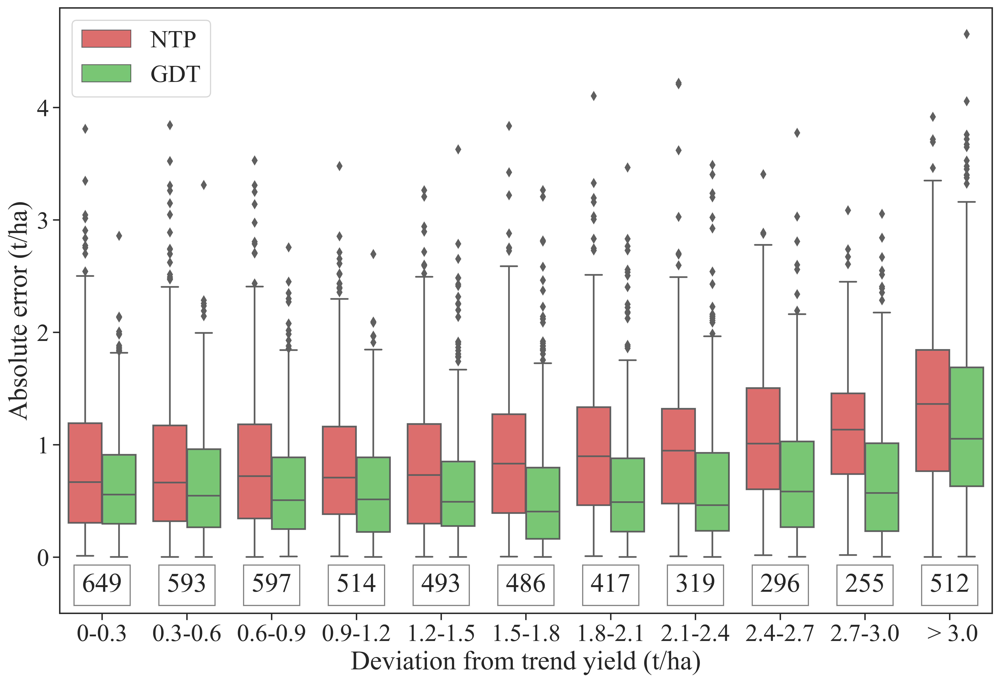

In [241]:
import statsmodels.api as sm
# 图 GDT VS. NTP
# 融合列
merged_df = pd.merge(merged_NTP, data, left_index=True, right_index=True,how = 'inner')
merged_df['GDT_res_abs'] = merged_GDT['GDT_res_abs']

sns.set_theme(style = 'ticks', font="Times New Roman", font_scale = 2)
# Draw Plot
plt.figure(figsize=(15,10), dpi= 500)

# # 使用cut函数将数据分为5个组
# merged_df['GDT_res_cut'] = pd.cut(merged_df['GDT_res'], bins=5, labels=['very low','low', 'medium', 'very high','high'])
# Define the bin edges
print(merged_df.shape)
bin_edges = [0, 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3.0, 9.0]
bin_labels = ['0-0.3', '0.3-0.6', '0.6-0.9', '0.9-1.2', '1.2-1.5', '1.5-1.8', '1.8-2.1','2.1-2.4','2.4-2.7','2.7-3.0',' > 3.0']
# Use pd.cut to create a new column with the custom bins
merged_df['GDT_res_cut'] = pd.cut(merged_df['GDT_res'], bins=bin_edges, labels=bin_labels)

# Count the number of values in each bin using value_counts()
bin_counts = merged_df['GDT_res_cut'].value_counts()
print(bin_counts.sum())
# 使用melt函数将NTP_res_abs和GDT_res_abs两列转换成一个列变量
df_melt = pd.melt(merged_df, id_vars=['GDT_res_cut'], value_vars=['NTP_res_abs', 'GDT_res_abs'], var_name='De-trend', value_name='value')

# Rename the legend of every variable to NTP and GDT
df_melt['De-trend'] = df_melt['De-trend'].map({'NTP_res_abs': 'NTP', 'GDT_res_abs': 'GDT'})

# 使用Seaborn的boxplot()函数绘制箱线图
ax = sns.boxplot(x='GDT_res_cut', y='value', hue='De-trend', data=df_melt,palette=['#f15b5b','#69d569'])

# Add the bin counts to the plot
for i, label in enumerate(bin_labels):
    # Get the x position of the label
    x = i
    
    # Get the y position of the count
    count = merged_df['GDT_res_cut'].value_counts().loc[label]
    
    # Add the count to the plot
    ax.text(x, -0.25, count, ha='center', va='center', bbox=dict(facecolor='none', edgecolor='gray', boxstyle='square'))

# Set the y-axis ticks to range from 0 to 2 with an interval of 0.25
# ax.set_yticks(np.arange(0, 2.5, 0.25))
plt.xticks(fontname = 'Times New Roman')
plt.yticks(fontname = 'Times New Roman')
# 移动y轴的零点
ax.set_ylim(bottom=-0.5)

plt.xlabel('Deviation from trend yield (t/ha)',fontname = 'Times New Roman')
plt.ylabel(r'Absolute error (t/ha)',fontname = 'Times New Roman')


plt.legend(loc = 'upper left')
plt.savefig(u'D:/论文-产量趋势利用/可视化/python图/'+'玉米GDT_预测误差随偏离程度变化的关系图(绝对).jpg',dpi=500, bbox_inches='tight')
plt.show()

(5131, 14)
0-0.3      966
0.3-0.6    938
0.6-0.9    838
0.9-1.2    710
1.2-1.5    532
1.5-1.8    400
1.8-2.1    234
2.1-2.4    161
 > 3.0     151
2.4-2.7    122
2.7-3.0     79
Name: ILYF_res_cut, dtype: int64
966
938
838
710
532
400
234
161
122
79
151


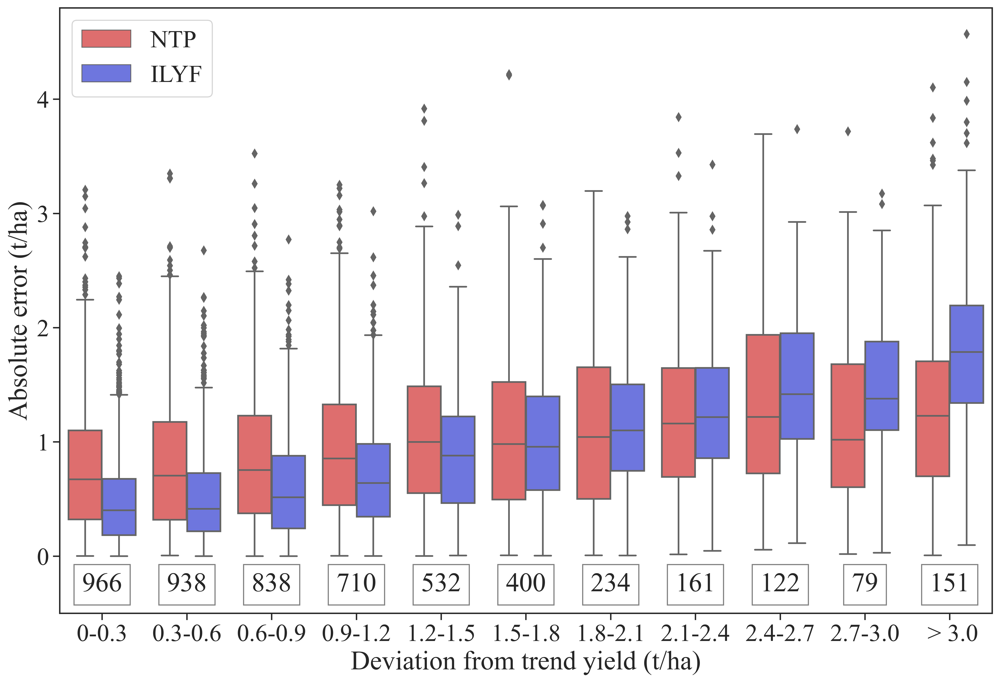

In [244]:
# 图
# 融合列
merged_df = pd.merge(merged_NTP, data, left_index=True, right_index=True,how = 'inner')
merged_df['ILYF_res_abs'] = merged_ILYF['ILYF_res_abs']

sns.set_theme(style = 'ticks', font="Times New Roman", font_scale = 2)
# Draw Plot
plt.figure(figsize=(15,10), dpi= 500)
print(merged_df.shape)
# # 使用cut函数将数据分为5个组
# merged_df['GDT_res_cut'] = pd.cut(merged_df['GDT_res'], bins=5, labels=['very low','low', 'medium', 'very high','high'])
# Define the bin edges
bin_edges = [0, 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3.0, 9.0]
bin_labels = ['0-0.3', '0.3-0.6', '0.6-0.9', '0.9-1.2', '1.2-1.5', '1.5-1.8', '1.8-2.1','2.1-2.4','2.4-2.7','2.7-3.0',' > 3.0']
# Use pd.cut to create a new column with the custom bins
merged_df['ILYF_res_cut'] = pd.cut(merged_df['ILYF_res'], bins=bin_edges, labels=bin_labels)

# Count the number of values in each bin using value_counts()
bin_counts = merged_df['ILYF_res_cut'].value_counts()
print(bin_counts)
# 使用melt函数将NTP_res_abs和GDT_res_abs两列转换成一个列变量
df_melt = pd.melt(merged_df, id_vars=['ILYF_res_cut'], value_vars=['NTP_res_abs', 'ILYF_res_abs'], var_name='De-trend', value_name='value')

# Rename the legend of every variable to NTP and GDT
df_melt['De-trend'] = df_melt['De-trend'].map({'NTP_res_abs': 'NTP', 'ILYF_res_abs': 'ILYF'})

# 使用Seaborn的boxplot()函数绘制箱线图
ax = sns.boxplot(x='ILYF_res_cut', y='value', hue='De-trend', data=df_melt, palette=['#f15b5b','#5b66f1'])

# Add the bin counts to the plot
for i, label in enumerate(bin_labels):
    # Get the x position of the label
    x = i
    
    # Get the y position of the count
    count = merged_df['ILYF_res_cut'].value_counts().loc[label]
    print(count)
    # Add the count to the plot
    ax.text(x, -0.25, count, ha='center', va='center', bbox=dict(facecolor='none', edgecolor='gray', boxstyle='square'))

# Set the y-axis ticks to range from 0 to 2 with an interval of 0.25
# ax.set_yticks(np.arange(0, 2.5, 0.25))
plt.xticks(fontname = 'Times New Roman')
plt.yticks(fontname = 'Times New Roman')
# 移动y轴的零点
ax.set_ylim(bottom=-0.5)
plt.xticks(fontname = 'Times New Roman')
plt.yticks(fontname = 'Times New Roman')

plt.xlabel('Deviation from trend yield (t/ha)',fontname = 'Times New Roman')
plt.ylabel(r'Absolute error (t/ha)',fontname = 'Times New Roman')

plt.legend(loc = 'upper left')
plt.savefig(u'D:/论文-产量趋势利用/可视化/python图/'+'玉米ILYF_预测误差随偏离程度变化的关系图（绝对）.jpg',dpi=500, bbox_inches='tight')
plt.show()